# Machine Learning for Air Pollution Forecasting

In [1]:
import os
import numpy as np
import tensorflow as tf
import pennylane as qml
import pandas as pd
from scipy import stats
from matplotlib import pyplot as plt

from statistics import quantitative_analysis, get_mean_left_right_error_interval, verify_distribution_wilcoxtest

from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import LeakyReLU

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

tf.keras.backend.set_floatx('float64')
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

2025-08-28 10:37:10.834383: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-08-28 10:37:10.982189: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-08-28 10:37:11.014880: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-08-28 10:37:11.754786: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

In [2]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  # Restrict access of TensorFlow to specific GPU
  try:
    tf.config.experimental.set_visible_devices(gpus[2], 'GPU')
  except RuntimeError as e:
    # Visible devices must be set at program startup
    print(e)

In [3]:
tf.config.experimental.get_visible_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:2', device_type='GPU')]

## Data Functions

In [4]:
def load_table(path, prev, lookback):
    X = pd.read_csv(path)
    X.dropna(axis=0,how='any',inplace=True)
    
    # We remove all outliers from dataset
    X = X[X['EXT_PM_25'] < 1000] 

    if lookback > 1:
        for col in X.columns:
            X[col+'_Lookback'] = X.loc[:,col].shift(lookback-1)
        X = X.iloc[lookback-1:, :]

    # We copy the values in X to prepare the y dataset. The first row is removed from y 
    # since it does not have a previous value to serve as forecast
    y = X[:].drop(X.index[0])
    
    # We remove the last line in X since it doesn't have an equivalent y
    X = X.iloc[:-prev[-1],:]
    
    # We create the final y dataset by creating a new column with the predictions and 
    # removing the unnecessary information
    for i in prev:
        y[f'Prev {i} hour'] = y.loc[:,"EXT_PM_25"].shift(-(i-1))
    
    if prev[-1] == 1:
        y= y.iloc[:, -1:]
    else:
        y= y.iloc[:-(prev[-1]-1), -len(prev):]

    return X, y.values

In [5]:
def plot_history(history, ansatz, lookback, batch_size, dataset):
    plt.figure(figsize=(14,5), dpi=320, facecolor='w', edgecolor='k')
    plt.title(f"Classical Model - {ansatz} - Loss - Lookback {lookback}")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.plot(history.history['loss'], label="Loss/Epoch")
    plt.plot(history.history['val_loss'], label="Val Loss/Epoch")
    plt.xticks(range(0, len(history.history['loss'])+1, 30))
    plt.legend()
    plt.grid()

    subdir = f"Ansatz-{ansatz}-Lookback-{lookback}-300"
    
    path = os.path.abspath(os.path.join(os.getcwd(), 'plots', subdir))
    os.makedirs(path, exist_ok=True)
    filename = f"loss-history-pollution-{ansatz}-layers-lookback-{lookback}-batch-{batch_size}-{dataset}.png"
    print(f"Saving history in {os.path.join(path,filename)}")
    plt.savefig(os.path.join(path,filename))

    plt.show()

    values = np.array([list(range(1, len(history.history['loss'])+1)), history.history['loss'], history.history['val_loss']])
    loss_pd = pd.DataFrame(np.transpose(values))
    loss_pd.columns = ["Epoch", "Loss", "Val Loss"]
    loss_pd = loss_pd.set_index("Epoch")
    path = os.path.abspath(os.path.join(os.getcwd(), 'analysis', subdir))
    os.makedirs(path, exist_ok=True)
    filename = f"loss-pollution-{ansatz}-layers-lookback-{lookback}-batch-{batch_size}-{dataset}.csv"
    loss_pd.to_csv(os.path.join(path,filename))

In [6]:
def plot_prediction_versus_observed(y_test, y_pred, mean_error_normal, ansatz, lookback, batch_size, dataset, prev):
    
    subdir = f"Ansatz-{ansatz}-Lookback-{lookback}-300"
    
    for i in range(len(prev)):
        fig, ax = plt.subplots(figsize=(20,5), dpi=320, facecolor='w', edgecolor='k')
        plt.title(f"Classical Model - {ansatz} - Lookback {lookback} - PM25 quantity for {prev[i]} hours ahead")
        plt.xlabel("Time")
        plt.ylabel("PM 2.5 (g/m³)")
        
        plt.plot(y_pred[:,i], label="Prediction", color='blue')
        plt.fill_between(range(y_pred.shape[0]), y_pred[:,i]-mean_error_normal[0,i], y_pred[:,i]+mean_error_normal[0,i], color='blue', alpha=0.05)
        plt.plot(y_test[:,i], label="Original", color='orange')
        plt.xticks(rotation=45)
        
        plt.legend()

        path = os.path.abspath(os.path.join(os.getcwd(), 'plots', subdir))
        filename = f"prediction-pollution-{ansatz}-layers-lookback-{lookback}-batch-{batch_size}-{prev[i]}-hours-{dataset}.png"
        print(f"Saving Prediction Plot in {os.path.join(path,filename)}")
        os.makedirs(path, exist_ok=True)
        plt.savefig(os.path.join(path,filename))

        plt.show()

## Data loading

We used the data provided by the iSCAPE (Improving the Smart Control of Air Pollution in Europe) project (available at https://www.iscapeproject.eu/iscape-data, accessed on 08 January 2024). The three datasets used were:

- Living Lab Station data Jun-Oct 2019, Sutherland Memorial Park, Guildford (DS_TS_099)
- Field campaign data for evaluating green infrastructure in Guildford (DS_TS_102)
- Living Lab Station data Feb-Sept 2019, Stoke Park, Guildford (DS_TS_103).

In [7]:
prevision_window = [1,2,3,4,5,6]
lookback = 2
dataset = "Wavelets"
#dataset = "Base"
batch_size = 128

In [8]:
print("\nLoading Datasets\n")
path_stoke = os.path.abspath(os.path.join(os.getcwd(), os.pardir, 'data', 'stoke'))
path_suther = os.path.abspath(os.path.join(os.getcwd(), os.pardir, 'data', 'suther'))

filename_train = "wavelets-lvl5-train.csv" if dataset == "Wavelets" else "train.csv"
filename_test  = "wavelets-lvl5-test.csv"  if dataset == "Wavelets" else "test.csv"

train_file_stoke  = os.path.join(path_stoke, filename_train)
train_file_suther = os.path.join(path_suther, filename_train)
test_file_stoke   = os.path.join(path_stoke, filename_test)
test_file_suther  = os.path.join(path_suther, filename_test)

print(f"importing data from {train_file_stoke}")
X_train_stoke, y_train_stoke = load_table(train_file_stoke, prevision_window, lookback)
print(f"importing data from {train_file_suther}")
X_train_suther, y_train_suther = load_table(train_file_suther, prevision_window, lookback)

X_all = pd.concat([X_train_stoke, X_train_suther], axis=0)
y_all = np.vstack((y_train_stoke,y_train_suther))

#X_all = X_train_stoke
#y_all = y_train_stoke


print(f"importing data from {test_file_stoke}")
X_test_stoke, y_test_stoke = load_table(test_file_stoke, prevision_window, lookback)
print(f"importing data from {test_file_suther}")
X_test_suther, y_test_suther = load_table(test_file_suther, prevision_window, lookback)

X_test = pd.concat([X_test_stoke, X_test_suther], axis=0)
y_test = np.vstack((y_test_stoke,y_test_suther))

#X_test = X_test_stoke
#y_test = y_test_stoke


plot_time = X_test['Time'].values


Loading Datasets

importing data from /home/otto.pires/air-polution-forecasting-quantum/data/stoke/wavelets-lvl5-train.csv
importing data from /home/otto.pires/air-polution-forecasting-quantum/data/suther/wavelets-lvl5-train.csv
importing data from /home/otto.pires/air-polution-forecasting-quantum/data/stoke/wavelets-lvl5-test.csv
importing data from /home/otto.pires/air-polution-forecasting-quantum/data/suther/wavelets-lvl5-test.csv


In [9]:
if lookback > 1:
    X_all = X_all.drop(["Time", "Month", "Time_Lookback", "Month_Lookback"], axis=1)
    X_test = X_test.drop(["Time", "Month", "Time_Lookback", "Month_Lookback"], axis=1)
else:
    X_all = X_all.drop(["Time", "Month"], axis=1)
    X_test = X_test.drop(["Time", "Month"], axis=1)

In [10]:
print(f"\nThere are {X_all.shape[1]} features and {X_all.shape[0]} instances in All Train set\n")
print(X_all.head())
print(f"\nThere are {X_test.shape[1]} features and {X_test.shape[0]} instances in All Test set\n")
print(X_test.head())


There are 172 features and 4338 instances in All Train set

        TEMP        HUM       PRESS  EXT_PM_25    CO_PRE    NO2_PRE  \
1  13.923167  46.929833  101.320000  15.016667  0.226035  16.237973   
2  13.794167  47.107667  101.349667  17.533333  0.219977  16.949071   
3  13.798500  47.212667  101.387333  18.966667  0.218026  16.976633   
4  13.862167  47.418500  101.429167  13.700000  0.215322  16.410233   
5  13.724167  47.733667  101.492667  17.333333  0.212467  15.944438   

      O3_PRE  SIN HOUR  COS HOUR   SIN DAY  ...  \
1  18.874601  0.258819  0.965926  0.201299  ...   
2  18.829282  0.500000  0.866025  0.201299  ...   
3  19.074056  0.707107  0.707107  0.201299  ...   
4  19.427294  0.866025  0.500000  0.201299  ...   
5  19.402194  0.965926  0.258819  0.201299  ...   

   Ozone-wavelet-A-nivel1_Lookback  Ozone-wavelet-D-nivel1_Lookback  \
1                        21.951289                        -0.065346   
2                        19.237309                        -0.36

In [11]:
print("Size y_all", len(y_all),"\n", y_all[:5])
print("Size y_test_all", len(y_test),"\n", y_test[:5])
print("\n#########\n")

Size y_all 4338 
 [[17.53333333 18.96666667 13.7        17.33333333 26.81666667 31.11666667]
 [18.96666667 13.7        17.33333333 26.81666667 31.11666667 31.        ]
 [13.7        17.33333333 26.81666667 31.11666667 31.         31.4       ]
 [17.33333333 26.81666667 31.11666667 31.         31.4        29.36666667]
 [26.81666667 31.11666667 31.         31.4        29.36666667 29.86666667]]
Size y_test_all 1462 
 [[3.85       4.35       4.51666667 4.75       3.81666667 3.35      ]
 [4.35       4.51666667 4.75       3.81666667 3.35       3.45      ]
 [4.51666667 4.75       3.81666667 3.35       3.45       2.41666667]
 [4.75       3.81666667 3.35       3.45       2.41666667 1.83333333]
 [3.81666667 3.35       3.45       2.41666667 1.83333333 1.65      ]]

#########



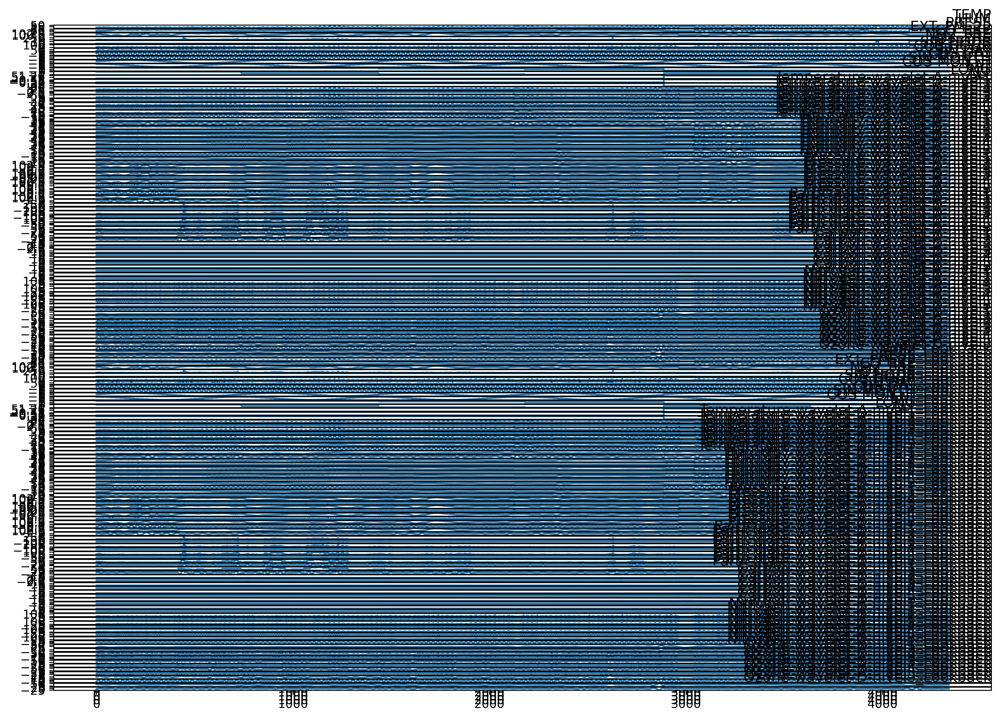

In [12]:
# load dataset
values = X_all.values
# specify columns to plot
groups = [i for i in range(len(X_all.columns))]
i = 1
# plot each column
plt.figure(figsize=(14,10), dpi=320, facecolor='w', edgecolor='k')
for group in groups:
    plt.subplot(len(groups), 1, i)
    plt.plot(values[:, group])
    plt.title(X_all.columns[group], y=0.5, loc='right')
    i += 1
plt.show()

In [13]:
X_all.max()

TEMP                                52.491000
HUM                                 76.544167
PRESS                              103.755667
EXT_PM_25                          368.666667
CO_PRE                              14.393109
                                      ...    
Ozone-wavelet-D-nivel3_Lookback     30.524208
Ozone-wavelet-A-nivel4_Lookback     45.565807
Ozone-wavelet-D-nivel4_Lookback     11.494684
Ozone-wavelet-A-nivel5_Lookback     53.319802
Ozone-wavelet-D-nivel5_Lookback     24.098539
Length: 172, dtype: float64

## Data Preprocessing

### Data Scaling

The feature map reads the data as a rotation on angle $\theta$, therefore we will scale our data on the range 0 to $2\pi$.

In [14]:
print("\nScaling Data\n")
scaler_x = MinMaxScaler(feature_range=(0, 1))
Xs_all  = scaler_x.fit_transform(X_all)
Xs_test = scaler_x.transform(X_test)


Scaling Data



### Spliting Train and Validation sets

In [15]:
print("\nSplitting Train Data\n")
train_ratio = 0.7
Xs_train, Xs_val, y_train, y_val = train_test_split(Xs_all, y_all, test_size=1 - train_ratio)


Splitting Train Data



In [16]:
print(f"There are {Xs_train.shape[1]} features and {Xs_train.shape[0]} instances in Train set")
print(f"There are {Xs_val.shape[1]} features and {Xs_val.shape[0]} instances in Val set")
print(f"There are {Xs_test.shape[1]} features and {Xs_test.shape[0]} instances in Test set")

There are 172 features and 3036 instances in Train set
There are 172 features and 1302 instances in Val set
There are 172 features and 1462 instances in Test set


In [17]:
np.set_printoptions(precision=3)
np.set_printoptions(suppress=True)
print(f"Scaled data\n", Xs_train[:5])

Scaled data
 [[0.422 0.482 0.603 0.013 0.012 0.103 0.256 0.146 0.854 0.015 0.373 0.75
  0.134 0.    0.    1.    0.421 0.623 0.467 0.354 0.504 0.529 0.407 0.609
  0.49  0.477 0.482 0.433 0.479 0.533 0.428 0.509 0.407 0.497 0.37  0.483
  0.604 0.497 0.604 0.478 0.601 0.42  0.616 0.481 0.609 0.604 0.015 0.501
  0.026 0.499 0.089 0.483 0.081 0.512 0.116 0.496 0.057 0.511 0.096 0.496
  0.081 0.497 0.135 0.493 0.157 0.505 0.111 0.477 0.175 0.443 0.213 0.47
  0.329 0.375 0.394 0.536 0.348 0.491 0.491 0.481 0.384 0.571 0.437 0.411
  0.468 0.517 0.48  0.484 0.599 0.011 0.013 0.138 0.22  0.067 0.75  0.015
  0.373 0.75  0.134 0.    0.    1.    0.491 0.543 0.525 0.4   0.544 0.59
  0.407 0.664 0.488 0.481 0.48  0.453 0.481 0.523 0.428 0.513 0.408 0.496
  0.371 0.482 0.6   0.483 0.602 0.47  0.602 0.396 0.619 0.473 0.61  0.608
  0.015 0.499 0.026 0.499 0.089 0.483 0.081 0.512 0.103 0.496 0.058 0.51
  0.097 0.498 0.081 0.497 0.136 0.493 0.157 0.505 0.144 0.484 0.204 0.45
  0.243 0.471 0.325 0.433 0.37

In [18]:
y_train[:5]

array([[ 4.033,  6.033,  9.333, 11.6  , 11.383, 10.45 ],
       [ 3.833,  3.883,  4.717,  7.267,  9.883,  5.867],
       [24.05 , 25.7  , 30.517, 27.8  , 27.167, 28.067],
       [ 3.783,  0.417,  2.2  ,  1.167,  2.733,  3.   ],
       [ 7.517,  9.683,  7.783,  8.483, 13.317, 12.8  ]])

In [19]:
n_qubits = Xs_train.shape[1] # n_features
print(f"\nCircuit size: {n_qubits} qubits\n")


Circuit size: 172 qubits



## Multilayer Perceptron

In [20]:
ansatz = "MLP"

In [21]:
def create_mlp(n_qubits, prev):
    
    input_layer = tf.keras.layers.Input(shape=(n_qubits,))
    
    first_hidden_layer = tf.keras.layers.Dense(10, activation='sigmoid')
    #first_hidden_layer = tf.keras.layers.Dense(10, LeakyReLU(alpha=0.01))
    #dropout_layer1 = tf.keras.layers.Dropout(0.1)
    
    second_hidden_layer = tf.keras.layers.Dense(17, activation='relu')
    #second_hidden_layer = tf.keras.layers.Dense(17, LeakyReLU(alpha=0.01))
    #dropout_layer2 = tf.keras.layers.Dropout(0.1)
    
    output_layer = tf.keras.layers.Dense(len(prev), LeakyReLU(alpha=0.01))
    #output_layer = tf.keras.layers.Dense(len(prev), LeakyReLU(alpha=0.01))

    opt = tf.keras.optimizers.Adam(learning_rate = 0.001)
    
    # Everything that creates variables should be under the strategy scope.
    # In general this is only model construction & `compile()`.
    model = tf.keras.models.Sequential([
        input_layer
        , first_hidden_layer
        , second_hidden_layer
        , output_layer])
    model.compile(loss=['mse'], optimizer=opt, metrics=['mae'])
    
    return model

## Training

After the model is created we start the training

In [22]:
mlp = create_mlp(n_qubits, prevision_window)
mlp.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 10)                1730      
                                                                 
 dense_1 (Dense)             (None, 17)                187       
                                                                 
 dense_2 (Dense)             (None, 6)                 108       
                                                                 
Total params: 2,025
Trainable params: 2,025
Non-trainable params: 0
_________________________________________________________________


2025-08-28 10:37:31.049041: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-08-28 10:37:31.699262: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 30974 MB memory:  -> device: 2, name: Tesla V100S-PCIE-32GB, pci bus id: 0000:ad:00.0, compute capability: 7.0


In [23]:
es=EarlyStopping(monitor='val_loss', min_delta=0, patience=6, verbose=0, mode='auto', baseline=None, restore_best_weights=True)

subdir = f"Ansatz-{ansatz}-Lookback-{lookback}-300"

checkpoint_path = os.path.join('checkpoint', subdir, f"cp-{ansatz}-lookback-{lookback}-"+"{epoch:04d}.ckpt")
os.makedirs(os.path.dirname(checkpoint_path), exist_ok=True)

# Create a callback that saves the model's weights
n_batches = len(Xs_train) / batch_size
n_batches = int(np.ceil(n_batches))
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path
                                                    , save_weights_only=True
                                                    , verbose=0
                                                    , save_freq=n_batches)

mlp_history_model = mlp.fit(Xs_train, y_train
                        , epochs=300, batch_size=batch_size
                        , verbose=1
                        , validation_data=(Xs_val, y_val)
                        , callbacks = [es, cp_callback])

Epoch 1/300
24/24 [==============================] - 2s 42ms/step - loss: 570.8625 - mae: 13.3634 - val_loss: 524.4940 - val_mae: 12.4692
Epoch 2/300
24/24 [==============================] - 0s 7ms/step - loss: 562.0390 - mae: 13.0601 - val_loss: 515.2462 - val_mae: 12.1326
Epoch 3/300
24/24 [==============================] - 0s 6ms/step - loss: 551.9920 - mae: 12.7256 - val_loss: 505.9442 - val_mae: 11.8096
Epoch 4/300
24/24 [==============================] - 0s 6ms/step - loss: 541.5171 - mae: 12.4024 - val_loss: 495.6669 - val_mae: 11.4935
Epoch 5/300
24/24 [==============================] - 0s 6ms/step - loss: 529.8972 - mae: 12.0959 - val_loss: 484.2663 - val_mae: 11.2121
Epoch 6/300
24/24 [==============================] - 0s 6ms/step - loss: 516.4525 - mae: 11.8140 - val_loss: 469.3539 - val_mae: 10.9351
Epoch 7/300
24/24 [==============================] - 0s 6ms/step - loss: 497.2148 - mae: 11.4750 - val_loss: 450.1842 - val_mae: 10.6585
Epoch 8/300
24/24 [=====================

### Plotting Loss

Saving history in /home/otto.pires/air-polution-forecasting-quantum/notebooks/plots/Ansatz-MLP-Lookback-2-300/loss-history-pollution-MLP-layers-lookback-2-batch-128-Wavelets.png


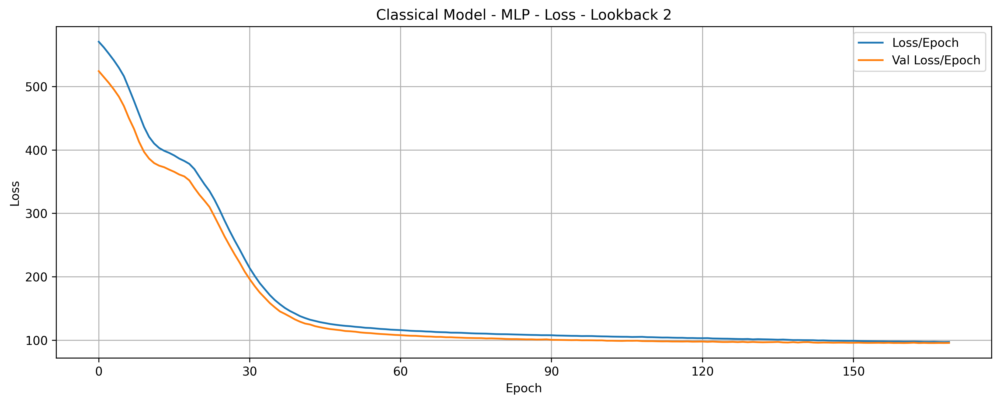

In [24]:
plot_history(mlp_history_model, ansatz, lookback, batch_size, dataset)

## Prediction

Prediction intervals were estimated using quantile regression applied to the errors of predictions made in the test dataset. These intervals were computed for 1 hour ahead.

In [25]:
mlp_y_pred = mlp.predict(Xs_test,verbose=1)
mean_predictions, mean_error_normal, mean_error_left_normal, mean_error_right_normal = get_mean_left_right_error_interval(mlp, Xs_val, y_val, y_test, mlp_y_pred)

41/41 [==============================] - 0s 786us/step


In [26]:
error_interval = [[str(i+1)+" hours"
                              , mean_predictions[0][i]
                              , mean_error_normal[0][i]
                              , mean_error_left_normal[0][i]
                              , mean_error_right_normal[0][i]
                          ] for i in range(len(mean_predictions[0]))
                         ]
pred_interval = pd.DataFrame(error_interval)
pred_interval.columns = ['Index', 'Mean Pred', 'Error Normal', 'Error Left', 'Error Right']
pred_interval = pred_interval.set_index('Index')
pred_interval.loc['Mean'] = pred_interval.mean()

pred_interval

,Mean Pred,Error Normal,Error Left,Error Right
Index,,,,
1 hours,8.648814,12.215050,-3.566236,20.863864
2 hours,8.633073,11.714772,-3.081698,20.347845
3 hours,8.790083,12.224128,-3.434045,21.014211
4 hours,8.869846,13.776548,-4.906702,22.646395
5 hours,8.859948,15.380318,-6.520371,24.240266
6 hours,9.151992,16.806738,-7.654746,25.958731
Mean,8.825626,13.686259,-4.860633,22.511885


In [27]:
subdir = f"Ansatz-{ansatz}-Lookback-{lookback}-300"
path = os.path.abspath(os.path.join(os.getcwd(), 'analysis', subdir))
os.makedirs(path, exist_ok=True)  
filename = f"pred_interval-{ansatz}-lookback-{lookback}-batch-{batch_size}-{dataset}.csv"
print(f"Saving Pred Interval in {os.path.join(path,filename)}")
pred_interval.to_csv(os.path.join(path,filename), index=False)

Saving Pred Interval in /home/otto.pires/air-polution-forecasting-quantum/notebooks/analysis/Ansatz-MLP-Lookback-2-300/pred_interval-MLP-lookback-2-batch-128-Wavelets.csv


Saving Prediction Plot in /home/otto.pires/air-polution-forecasting-quantum/notebooks/plots/Ansatz-MLP-Lookback-2-300/prediction-pollution-MLP-layers-lookback-2-batch-128-1-hours-Wavelets.png


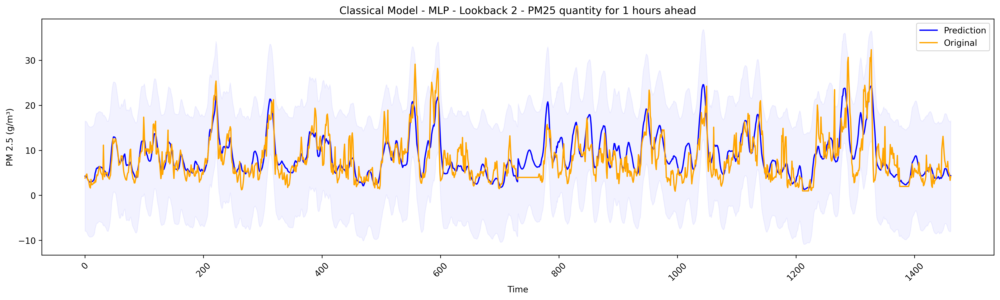

Saving Prediction Plot in /home/otto.pires/air-polution-forecasting-quantum/notebooks/plots/Ansatz-MLP-Lookback-2-300/prediction-pollution-MLP-layers-lookback-2-batch-128-2-hours-Wavelets.png


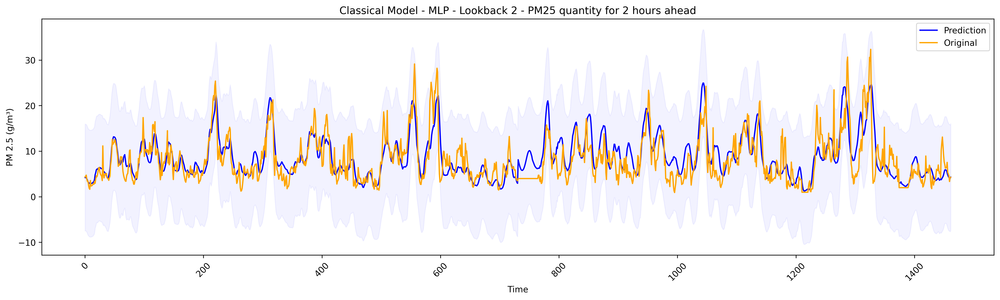

Saving Prediction Plot in /home/otto.pires/air-polution-forecasting-quantum/notebooks/plots/Ansatz-MLP-Lookback-2-300/prediction-pollution-MLP-layers-lookback-2-batch-128-3-hours-Wavelets.png


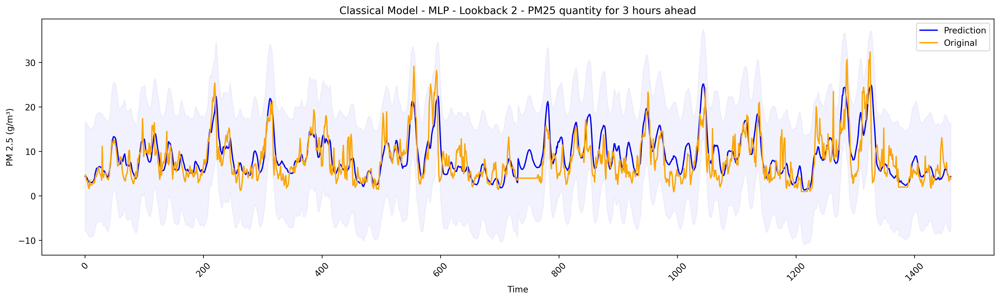

Saving Prediction Plot in /home/otto.pires/air-polution-forecasting-quantum/notebooks/plots/Ansatz-MLP-Lookback-2-300/prediction-pollution-MLP-layers-lookback-2-batch-128-4-hours-Wavelets.png


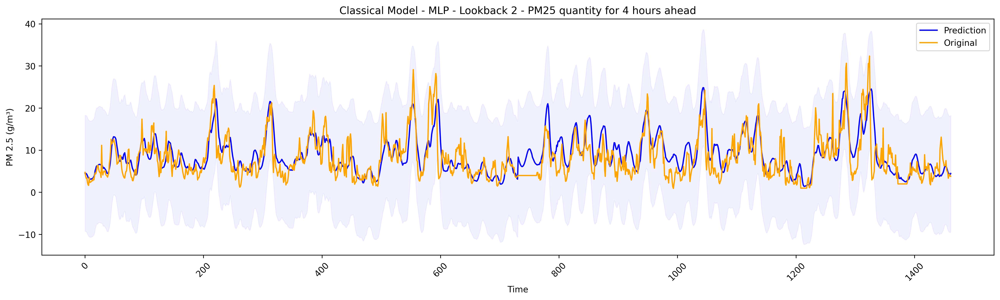

Saving Prediction Plot in /home/otto.pires/air-polution-forecasting-quantum/notebooks/plots/Ansatz-MLP-Lookback-2-300/prediction-pollution-MLP-layers-lookback-2-batch-128-5-hours-Wavelets.png


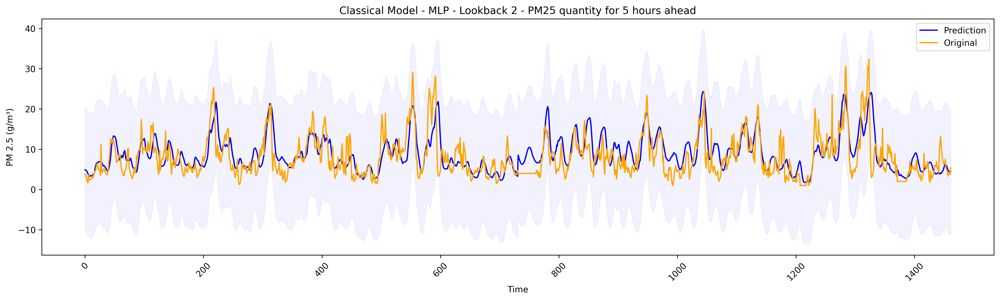

Saving Prediction Plot in /home/otto.pires/air-polution-forecasting-quantum/notebooks/plots/Ansatz-MLP-Lookback-2-300/prediction-pollution-MLP-layers-lookback-2-batch-128-6-hours-Wavelets.png


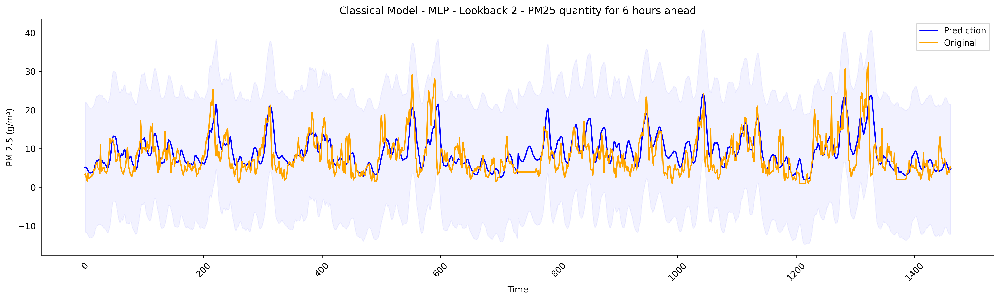

In [28]:
plot_prediction_versus_observed(y_test, mlp_y_pred, mean_error_normal, ansatz, lookback, batch_size, dataset, prevision_window)

## Statistical Analysis

The evaluation of our proposed Quantum Machine Learning (QML) method involved a comprehensive analysis of various performance metrics applied to both training and test datasets. These metrics included mean square error (MSE), mean absolute error (MAE), and normalized mean square error (NMSE), along with the Pearson correlation coefficient (r)

In [29]:
mlp_analysis = quantitative_analysis(y_test, mlp_y_pred)

subdir = f"Ansatz-{ansatz}-Lookback-{lookback}-300"

path = os.path.abspath(os.path.join(os.getcwd(), 'analysis', subdir))
os.makedirs(path, exist_ok=True)  

filename = f"metrics-{ansatz}-lookback-{lookback}-batch-{batch_size}-{dataset}.csv"
print(f"Saving Metrics in {os.path.join(path, filename)}")

mlp_analysis.to_csv(os.path.join(path, filename))

print("\n#########\n")


1 hours ahead
MAE: 2.5376558767126447
MSE: 11.707094563970566
NMSE: 0.457519432566822
RMSE: 3.421563175504811
NRMSE: 0.6764018277376415
R: 0.7574345210065379
R²: 0.5421674124485327
Fator de 2: 0.8878249

2 hours ahead
MAE: 2.5763596651089964
MSE: 12.065803831321816
NMSE: 0.47152724567998516
RMSE: 3.4735865947636624
NRMSE: 0.6866784150386447
R: 0.7519108074499102
R²: 0.5281500115098301
Fator de 2: 0.8850889

3 hours ahead
MAE: 2.6901957614690626
MSE: 13.13755661620149
NMSE: 0.513329577248526
RMSE: 3.6245767499394312
NRMSE: 0.716470220768823
R: 0.7344452983969353
R²: 0.4863190678046919
Fator de 2: 0.873461

4 hours ahead
MAE: 2.7878528122615753
MSE: 14.182725434323096
NMSE: 0.5540600157455963
RMSE: 3.765995941888825
NRMSE: 0.7443520778137159
R: 0.7107651348936278
R²: 0.4455607508418469
Fator de 2: 0.86456907

5 hours ahead
MAE: 2.9372567843380155
MSE: 15.6129045382172
NMSE: 0.6100816317707846
RMSE: 3.9513168106616305
NRMSE: 0.7810772252285842
R: 0.6721749814576373
R²: 0.3895007901102758

## LSTM

In [30]:
ansatz = "LSTM"

In [31]:
adapt_Xs_train = np.reshape(Xs_train, (Xs_train.shape[0], 1, Xs_train.shape[1]))
adapt_Xs_val = np.reshape(Xs_val, (Xs_val.shape[0], 1, Xs_val.shape[1]))
adapt_Xs_test = np.reshape(Xs_test, (Xs_test.shape[0], 1, Xs_test.shape[1]))

In [32]:
def create_lstm(n_qubits, prev):
    
    input_layer = tf.keras.layers.Input(shape=(1, n_qubits,))
    
    first_hidden_layer = tf.keras.layers.LSTM(64, activation='sigmoid')
    
    second_hidden_layer = tf.keras.layers.Dropout(0.4)
    
    third_hidden_layer = tf.keras.layers.Dense(17, activation='relu')
    
    output_layer = tf.keras.layers.Dense(len(prev), LeakyReLU(alpha=0.01))

    opt = tf.keras.optimizers.Adam(learning_rate = 0.001)
    
    # Everything that creates variables should be under the strategy scope.
    # In general this is only model construction & `compile()`.
    model = tf.keras.models.Sequential([
        input_layer
        , first_hidden_layer
        , second_hidden_layer
        , third_hidden_layer
        , output_layer])
    model.compile(loss=['mse'], optimizer=opt, metrics=['mae'])
    
    return model

In [33]:
lstm = create_lstm(n_qubits, prevision_window)
lstm.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 64)                60672     
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_3 (Dense)             (None, 17)                1105      
                                                                 
 dense_4 (Dense)             (None, 6)                 108       
                                                                 
Total params: 61,885
Trainable params: 61,885
Non-trainable params: 0
_________________________________________________________________


In [34]:
es=EarlyStopping(monitor='val_loss', min_delta=0, patience=6, verbose=0, mode='auto', baseline=None, restore_best_weights=True)

subdir = f"Ansatz-{ansatz}-Lookback-{lookback}-300"

checkpoint_path = os.path.join('checkpoint', subdir, f"cp-{ansatz}-lookback-{lookback}-"+"{epoch:04d}.ckpt")
os.makedirs(os.path.dirname(checkpoint_path), exist_ok=True)

# Create a callback that saves the model's weights
n_batches = len(Xs_train) / batch_size
n_batches = int(np.ceil(n_batches))
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path
                                                    , save_weights_only=True
                                                    , verbose=0
                                                    , save_freq=n_batches)

lstm_history_model = lstm.fit(adapt_Xs_train, y_train
                        , epochs=300, batch_size=batch_size
                        , verbose=1
                        , validation_data=(adapt_Xs_val, y_val)
                        , callbacks = [es, cp_callback])

Epoch 1/300
24/24 [==============================] - 1s 18ms/step - loss: 559.8371 - mae: 12.9825 - val_loss: 498.3694 - val_mae: 11.5628
Epoch 2/300
24/24 [==============================] - 0s 9ms/step - loss: 518.0081 - mae: 11.8272 - val_loss: 457.8583 - val_mae: 10.6435
Epoch 3/300
24/24 [==============================] - 0s 9ms/step - loss: 478.2061 - mae: 11.2668 - val_loss: 425.6197 - val_mae: 10.5810
Epoch 4/300
24/24 [==============================] - 0s 9ms/step - loss: 449.2348 - mae: 11.3986 - val_loss: 405.5881 - val_mae: 11.1333
Epoch 5/300
24/24 [==============================] - 0s 9ms/step - loss: 423.3977 - mae: 11.6966 - val_loss: 381.5499 - val_mae: 11.3279
Epoch 6/300
24/24 [==============================] - 0s 9ms/step - loss: 403.2516 - mae: 11.9258 - val_loss: 370.8090 - val_mae: 11.6221
Epoch 7/300
24/24 [==============================] - 0s 9ms/step - loss: 394.1349 - mae: 12.0253 - val_loss: 364.6419 - val_mae: 11.6018
Epoch 8/300
24/24 [=====================

Saving history in /home/otto.pires/air-polution-forecasting-quantum/notebooks/plots/Ansatz-LSTM-Lookback-2-300/loss-history-pollution-LSTM-layers-lookback-2-batch-128-Wavelets.png


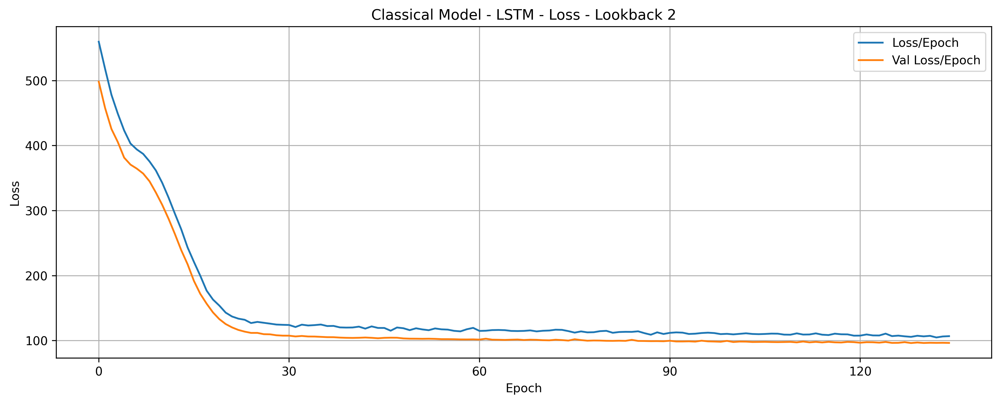

In [35]:
plot_history(lstm_history_model, ansatz, lookback, batch_size, dataset)

41/41 [==============================] - 0s 1ms/step
Saving Pred Interval in /home/otto.pires/air-polution-forecasting-quantum/notebooks/analysis/Ansatz-LSTM-Lookback-2-300/pred_interval-LSTM-lookback-2-batch-128-Wavelets.csv
Saving Prediction Plot in /home/otto.pires/air-polution-forecasting-quantum/notebooks/plots/Ansatz-LSTM-Lookback-2-300/prediction-pollution-LSTM-layers-lookback-2-batch-128-1-hours-Wavelets.png


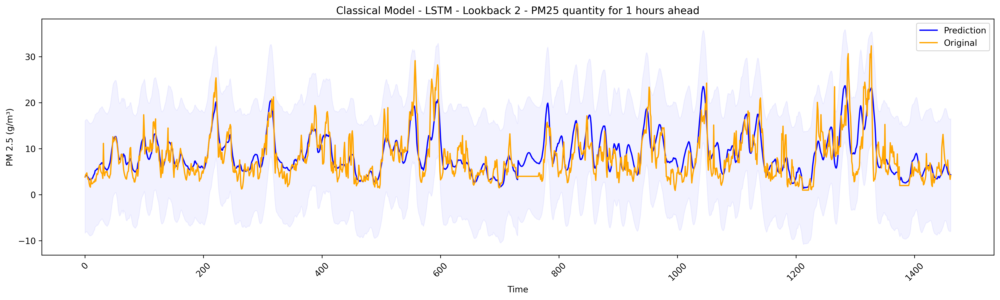

Saving Prediction Plot in /home/otto.pires/air-polution-forecasting-quantum/notebooks/plots/Ansatz-LSTM-Lookback-2-300/prediction-pollution-LSTM-layers-lookback-2-batch-128-2-hours-Wavelets.png


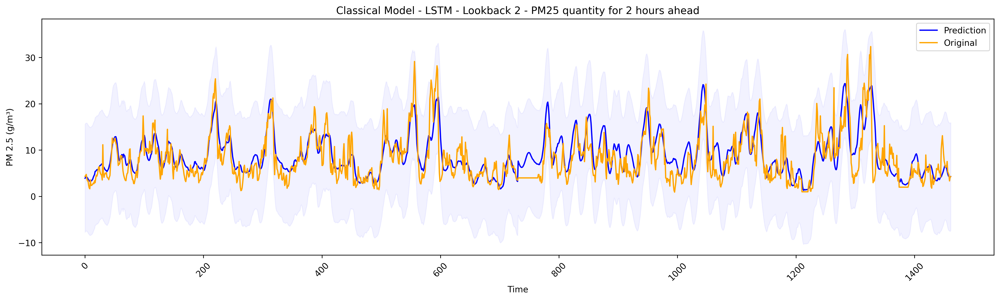

Saving Prediction Plot in /home/otto.pires/air-polution-forecasting-quantum/notebooks/plots/Ansatz-LSTM-Lookback-2-300/prediction-pollution-LSTM-layers-lookback-2-batch-128-3-hours-Wavelets.png


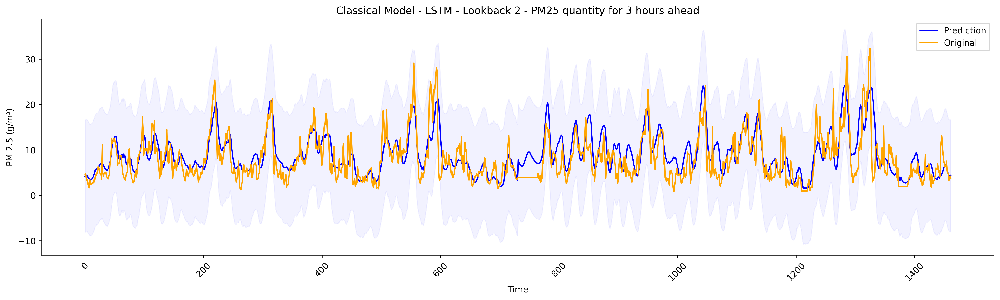

Saving Prediction Plot in /home/otto.pires/air-polution-forecasting-quantum/notebooks/plots/Ansatz-LSTM-Lookback-2-300/prediction-pollution-LSTM-layers-lookback-2-batch-128-4-hours-Wavelets.png


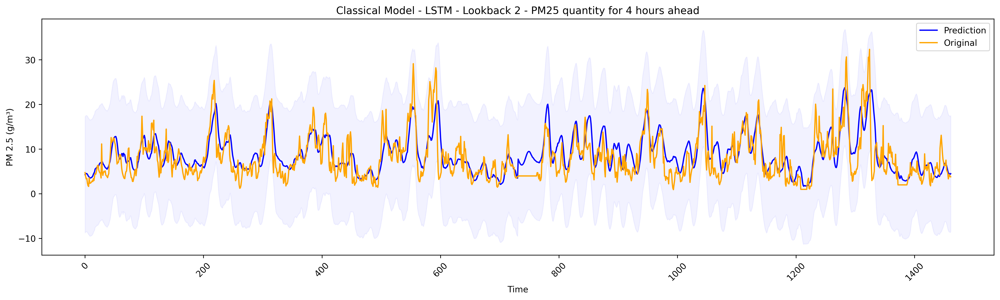

Saving Prediction Plot in /home/otto.pires/air-polution-forecasting-quantum/notebooks/plots/Ansatz-LSTM-Lookback-2-300/prediction-pollution-LSTM-layers-lookback-2-batch-128-5-hours-Wavelets.png


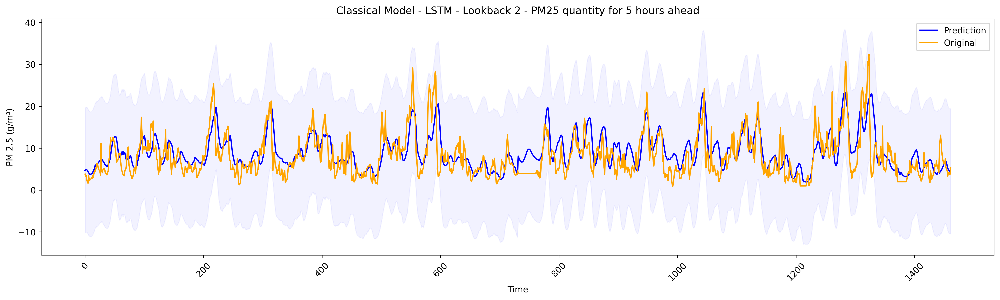

Saving Prediction Plot in /home/otto.pires/air-polution-forecasting-quantum/notebooks/plots/Ansatz-LSTM-Lookback-2-300/prediction-pollution-LSTM-layers-lookback-2-batch-128-6-hours-Wavelets.png


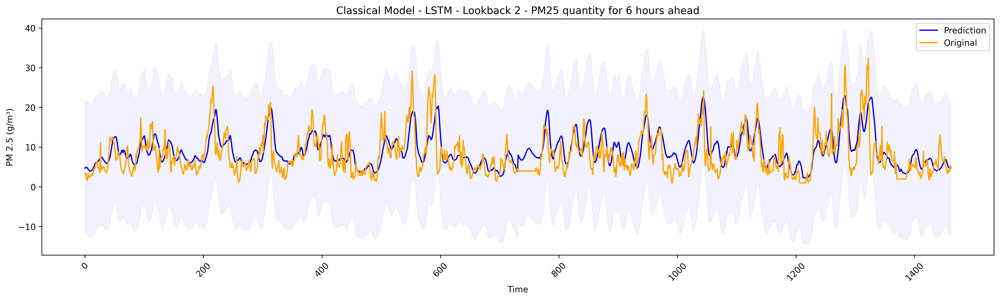

In [36]:
lstm_y_pred = lstm.predict(adapt_Xs_test,verbose=1)
mean_predictions, mean_error_normal, mean_error_left_normal, mean_error_right_normal = get_mean_left_right_error_interval(lstm, adapt_Xs_val, y_val, y_test, lstm_y_pred)
error_interval = [[str(i+1)+" hours"
                              , mean_predictions[0][i]
                              , mean_error_normal[0][i]
                              , mean_error_left_normal[0][i]
                              , mean_error_right_normal[0][i]
                          ] for i in range(len(mean_predictions[0]))
                         ]
pred_interval = pd.DataFrame(error_interval)
pred_interval.columns = ['Index', 'Mean Pred', 'Error Normal', 'Error Left', 'Error Right']
pred_interval = pred_interval.set_index('Index')
pred_interval.loc['Mean'] = pred_interval.mean()

pred_interval
subdir = f"Ansatz-{ansatz}-Lookback-{lookback}-300"
path = os.path.abspath(os.path.join(os.getcwd(), 'analysis', subdir))
os.makedirs(path, exist_ok=True)  
filename = f"pred_interval-{ansatz}-lookback-{lookback}-batch-{batch_size}-{dataset}.csv"
print(f"Saving Pred Interval in {os.path.join(path,filename)}")
pred_interval.to_csv(os.path.join(path,filename), index=False)
plot_prediction_versus_observed(y_test, lstm_y_pred, mean_error_normal, ansatz, lookback, batch_size, dataset, prevision_window)

In [37]:
lstm_analysis = quantitative_analysis(y_test, lstm_y_pred)
lstm_analysis

lstm_analysis = quantitative_analysis(y_test, lstm_y_pred)

subdir = f"Ansatz-{ansatz}-Lookback-{lookback}-300"

path = os.path.abspath(os.path.join(os.getcwd(), 'analysis', subdir))
os.makedirs(path, exist_ok=True)  

filename = f"metrics-{ansatz}-lookback-{lookback}-batch-{batch_size}-{dataset}.csv"
print(f"Saving Metrics in {os.path.join(path, filename)}")

lstm_analysis.to_csv(os.path.join(path, filename))

print("\n#########\n")


1 hours ahead
MAE: 2.460970922783862
MSE: 11.176787985074066
NMSE: 0.4367947716582241
RMSE: 3.343170349395027
NRMSE: 0.6609045102420047
R: 0.7664064700890646
R²: 0.562906258614426
Fator de 2: 0.8946648

2 hours ahead
MAE: 2.5369387427466368
MSE: 11.693891790082812
NMSE: 0.4569930577475234
RMSE: 3.4196332829826668
NRMSE: 0.6760126165594273
R: 0.7638155936274712
R²: 0.5426941475517597
Fator de 2: 0.8830369

3 hours ahead
MAE: 2.633130588766646
MSE: 12.445103957132387
NMSE: 0.48627306734118114
RMSE: 3.5277618906514068
NRMSE: 0.697332823937882
R: 0.7485221621895991
R²: 0.5133940968837736
Fator de 2: 0.874829

4 hours ahead
MAE: 2.728570001912594
MSE: 13.229087301949027
NMSE: 0.5168053455423586
RMSE: 3.637181230286584
NRMSE: 0.7188917481390078
R: 0.7257361210464514
R²: 0.4828409204771196
Fator de 2: 0.86456907

5 hours ahead
MAE: 2.919633628084339
MSE: 14.869333882011498
NMSE: 0.5810262565736563
RMSE: 3.8560775254151074
NRMSE: 0.7622507832555218
R: 0.6862151912000034
R²: 0.4185760526278675